<a href="https://colab.research.google.com/github/dlsnfl03/Road-Segmentation_U-Net/blob/main/u_net_road.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 기본

Number of image files: 203
Number of mask files: 200
X shape after loading: (100, 128, 128, 3)
y shape after loading: (100, 128, 128, 3)
Epoch 1/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 137s 10s/step - accuracy: 0.3443 - loss: 0.0561
Epoch 2/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 135s 9s/step - accuracy: 0.4715 - loss: 0.0495
Epoch 3/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 151s 10s/step - accuracy: 0.4629 - loss: 0.0505
Epoch 4/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 138s 10s/step - accuracy: 0.4724 - loss: 0.0487
Epoch 5/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 139s 10s/step - accuracy: 0.4578 - loss: 0.0487
Epoch 6/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 127s 10s/step - accuracy: 0.4842 - loss: 0.0466
Epoch 7/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 146s 10s/step - accuracy: 0.4604 - loss: 0.0467
Epoch 8/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 144s 10s/step - accuracy: 0.4277 - loss: 0.0469
Epoch 9/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 138s 10s/step - accuracy: 0.5224 - loss: 0.0444
Epoch 10/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 144s 10s/step - accuracy: 0.4388 - loss: 0.0451
Epo

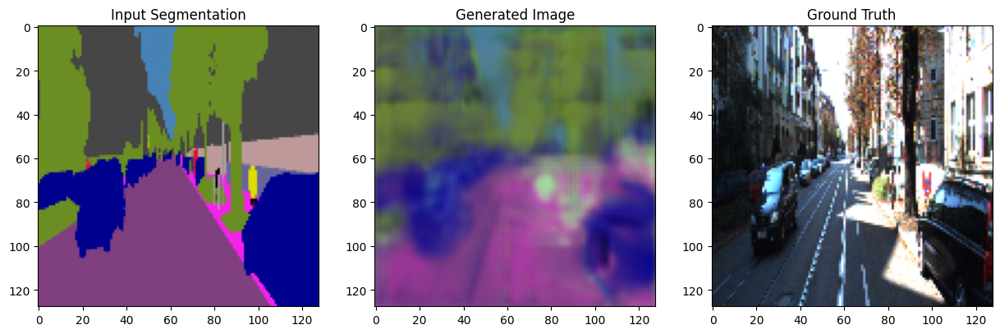

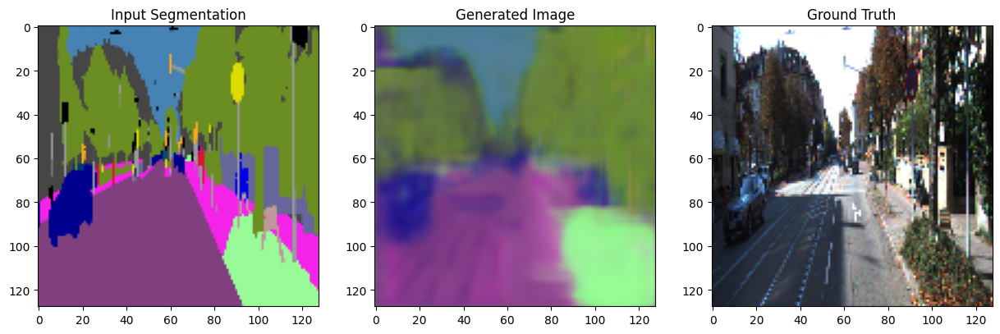

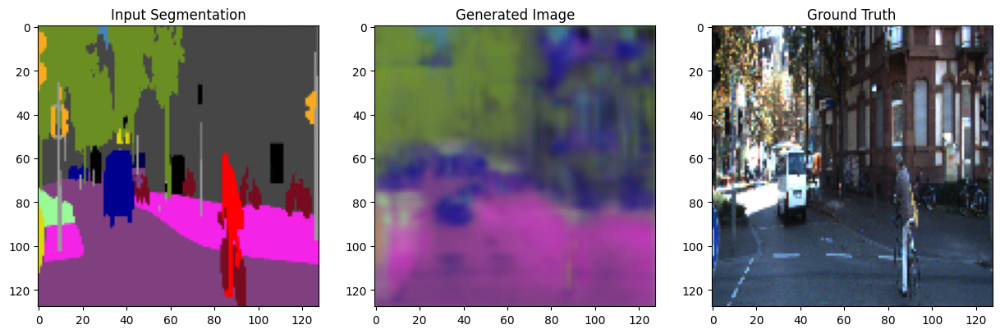

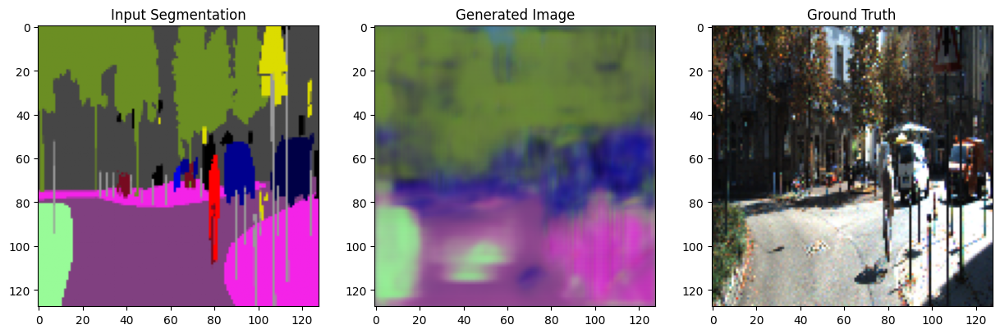

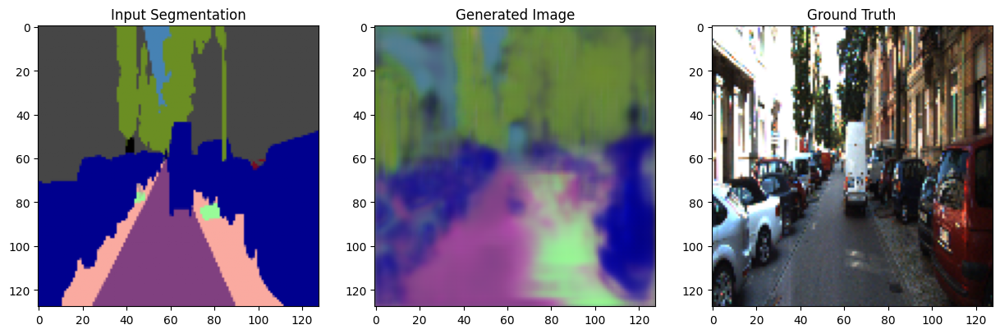

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, Input
from tensorflow.keras.models import Model
import numpy as np
import cv2
import matplotlib.pyplot as plt
from glob import glob

# 데이터셋 로드 및 전처리 함수
def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

# 이미지와 마스크 데이터를 불러오는 함수 정의 (데이터셋 크기 줄이기)
def load_data(image_paths, mask_paths, sample_size=100):
    images = [load_image(path) for path in image_paths[:sample_size]]
    masks = [load_image(path) for path in mask_paths[:sample_size]]
    return np.array(images), np.array(masks)

# U-Net 모델 정의
def build_unet(input_shape=(128, 128, 3)):
    inputs = Input(input_shape)

    # Down-sampling
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    # Bottleneck
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(b)

    # Up-sampling
    u3 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(b)
    u3 = concatenate([u3, c3])
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(u3)
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(c4)

    u2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u2 = concatenate([u2, c2])
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(c5)

    u1 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = concatenate([u1, c1])
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(c6)

    outputs = Conv2D(3, (1, 1), activation='sigmoid')(c6)
    model = Model(inputs, outputs)
    return model

# 모델 컴파일
unet_model = build_unet()
unet_model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])

# 데이터셋 경로 설정
image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/U-NET/data_semantics/training/image_2/*.png'))  # 원본 사진 경로
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/U-NET/data_semantics/training/semantic_rgb/*.png'))  # 세그멘테이션 이미지 경로

# 파일 경로 개수 확인
print(f"Number of image files: {len(image_paths)}")
print(f"Number of mask files: {len(mask_paths)}")

# 데이터가 없을 경우 경로 확인
if len(image_paths) == 0 or len(mask_paths) == 0:
    print("Error: Check if the file paths are correct and files are present in the specified directory.")

# 데이터 로드 (데이터셋 크기 줄이기)
sample_size = 100  # 학습에 사용할 샘플 수 설정
X, y = load_data(image_paths, mask_paths, sample_size)

# 로드된 데이터 확인
print("X shape after loading:", X.shape)
print("y shape after loading:", y.shape)

# 모델 학습
if X.shape[0] > 0 and y.shape[0] > 0:
    history = unet_model.fit(X, y, epochs=50, batch_size=8)
else:
    print("Error: No data available for training. Please check the dataset loading process.")


# 결과 확인
def show_predictions(model, sample_images, sample_masks):
    predictions = model.predict(sample_images)
    for i in range(len(sample_images)):
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.title("Input Segmentation")
        plt.imshow(sample_masks[i])
        plt.subplot(1, 3, 2)
        plt.title("Generated Image")
        plt.imshow(predictions[i])
        plt.subplot(1, 3, 3)
        plt.title("Ground Truth")
        plt.imshow(sample_images[i])
        plt.show()

# 예측 결과 시각화
sample_images, sample_masks = X[:5], y[:5]
show_predictions(unet_model, sample_images, sample_masks)


#도로만

Epoch 1/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 134s 9s/step - accuracy: 0.7875 - loss: 0.6005
Epoch 2/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 125s 10s/step - accuracy: 0.7735 - loss: 0.4876
Epoch 3/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 125s 10s/step - accuracy: 0.7863 - loss: 0.4046
Epoch 4/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 141s 10s/step - accuracy: 0.7821 - loss: 0.3653
Epoch 5/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 142s 9s/step - accuracy: 0.8371 - loss: 0.3348
Epoch 6/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 141s 9s/step - accuracy: 0.8805 - loss: 0.2856
Epoch 7/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 124s 9s/step - accuracy: 0.8810 - loss: 0.2884
Epoch 8/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 142s 10s/step - accuracy: 0.8727 - loss: 0.2870
Epoch 9/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 125s 10s/step - accuracy: 0.8783 - loss: 0.2742
Epoch 10/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 141s 9s/step - accuracy: 0.8853 - loss: 0.2577
Epoch 11/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 142s 10s/step - accuracy: 0.8753 - loss: 0.2985
Epoch 12/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 143s 10s/step - ac

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51077 (\N{HANGUL SYLLABLE IB}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47141 (\N{HANGUL SYLLABLE RYEOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48120 (\N{HANGUL SYLLABLE MI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51648 (\N{HANGUL SYLLABLE JI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPy

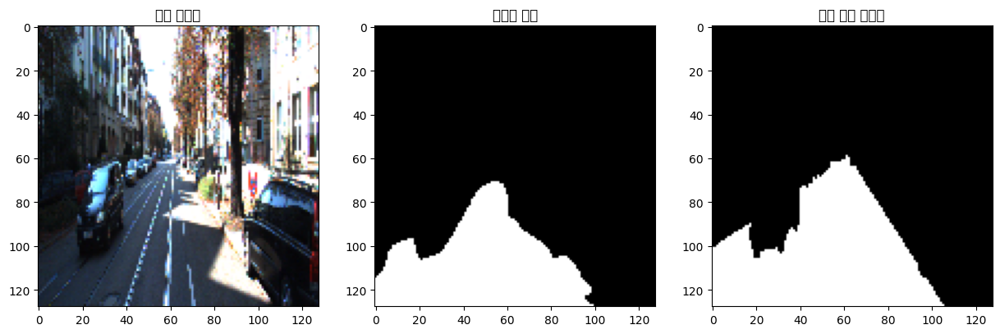

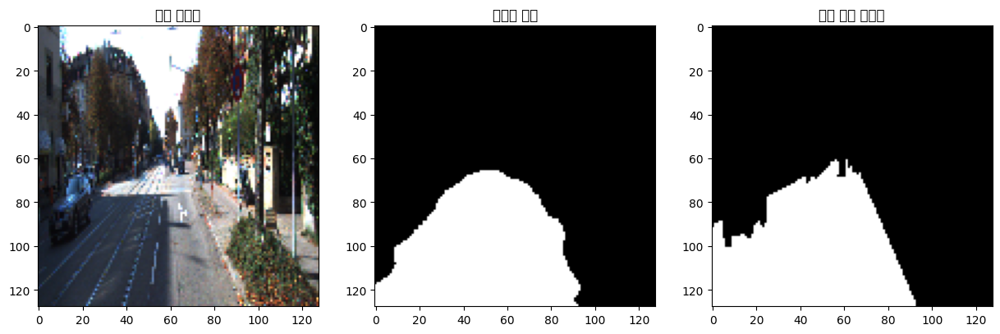

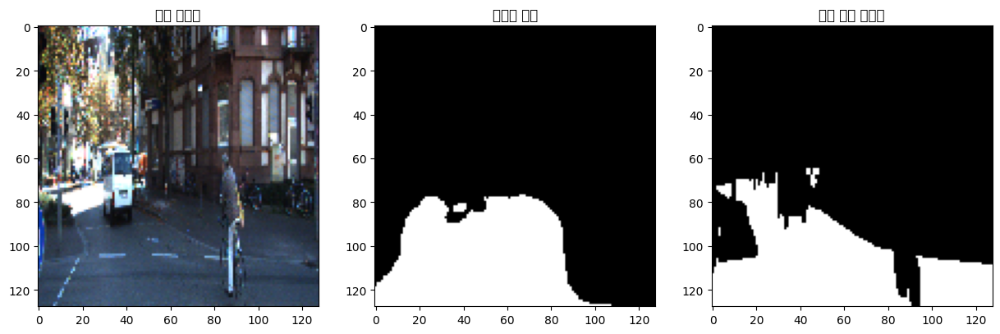

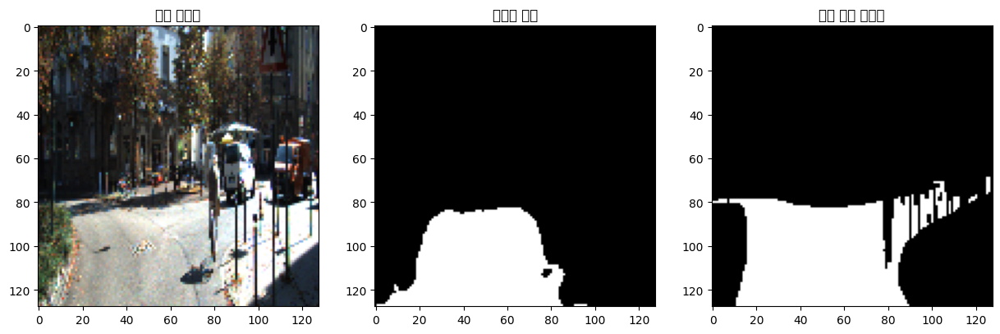

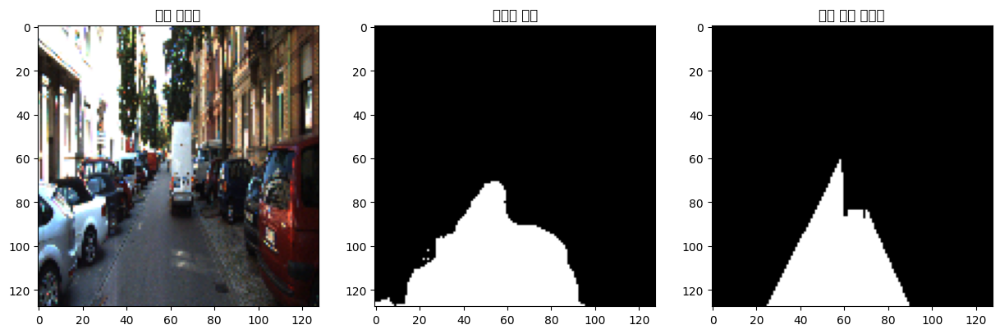

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, Input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt

# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        # 도로 색상 추출 (예: 도로 색상은 [128, 64, 128]이라고 가정)
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)  # 채널 추가

# U-Net 모델 정의 (이진 세그멘테이션용)
def build_unet_binary(input_shape=(128, 128, 3)):
    inputs = Input(input_shape)
    # 다운샘플링
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    # 병목 구간
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(b)
    # 업샘플링
    u3 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(b)
    u3 = concatenate([u3, c3])
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(u3)
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(c4)
    u2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u2 = concatenate([u2, c2])
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(c5)
    u1 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = concatenate([u1, c1])
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(c6)
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c6)  # 이진 출력
    model = Model(inputs, outputs)
    return model

# 모델 빌드 및 컴파일
unet_binary_model = build_unet_binary()
unet_binary_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# 데이터 로드
image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

X = np.array([load_image(path) for path in image_paths[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

# 모델 학습
history = unet_binary_model.fit(X, y, epochs=20, batch_size=8)

# 예측 결과 시각화
def show_binary_predictions(model, sample_images, sample_masks):
    predictions = model.predict(sample_images) > 0.5  # 0.5를 기준으로 이진화
    for i in range(len(sample_images)):
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.title("입력 이미지")
        plt.imshow(sample_images[i])
        plt.subplot(1, 3, 2)
        plt.title("예측된 도로")
        plt.imshow(predictions[i].squeeze(), cmap='gray')
        plt.subplot(1, 3, 3)
        plt.title("실제 도로 마스크")
        plt.imshow(sample_masks[i].squeeze(), cmap='gray')
        plt.show()

# 결과 확인
show_binary_predictions(unet_binary_model, X[:5], y[:5])


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


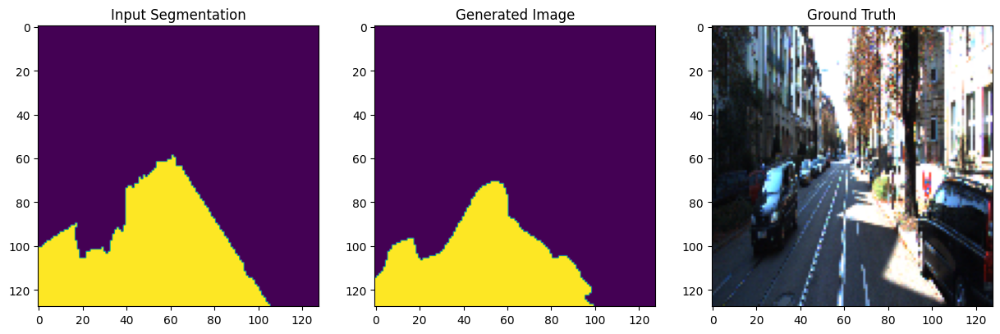

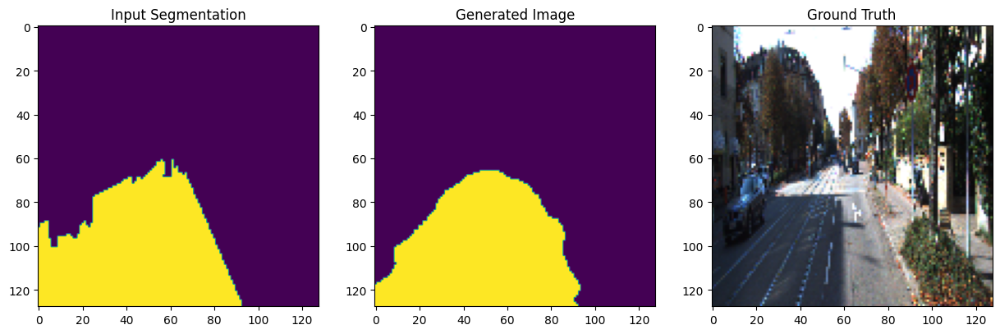

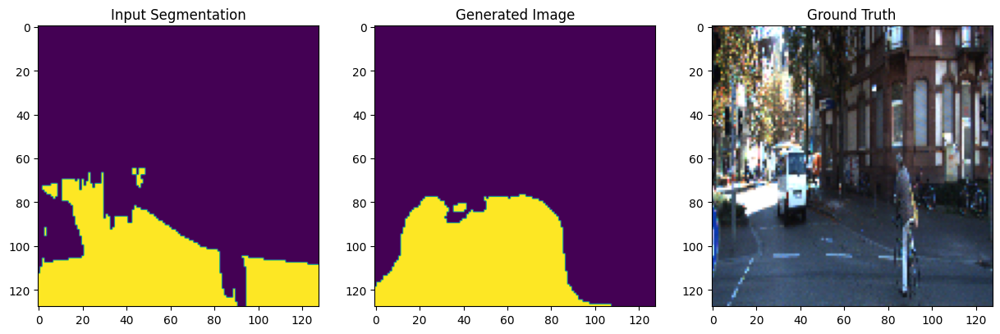

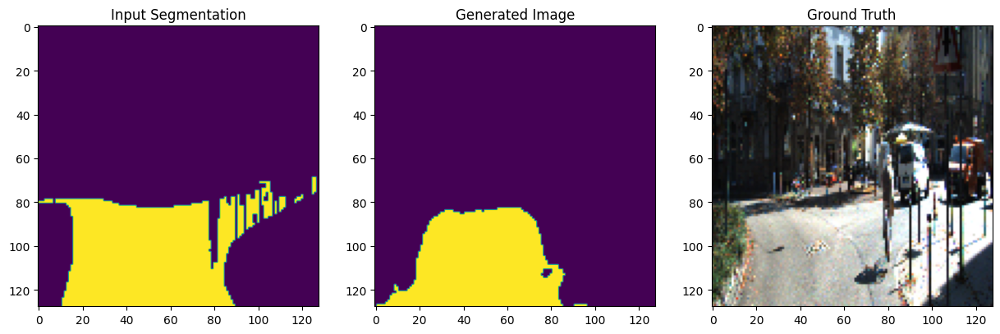

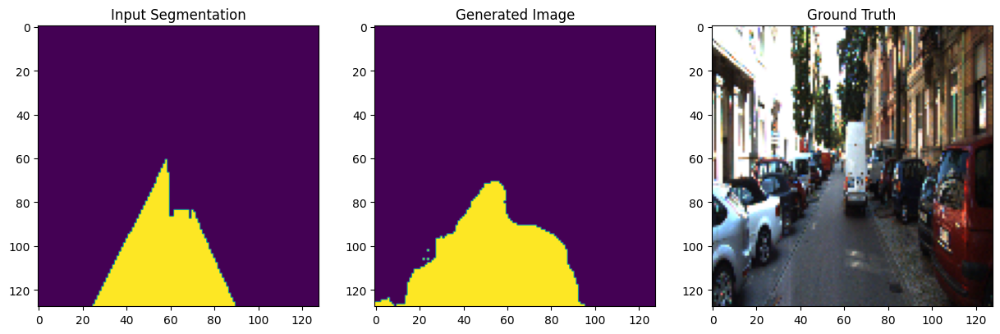

In [ ]:
# 예측 결과 시각화
def show_binary_predictions(model, sample_images, sample_masks):
    predictions = model.predict(sample_images) > 0.5  # 0.5를 기준으로 이진화
    for i in range(len(sample_images)):
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.title("Input Segmentation")
        plt.imshow(sample_masks[i])
        plt.subplot(1, 3, 2)
        plt.title("Generated Image")
        plt.imshow(predictions[i])
        plt.subplot(1, 3, 3)
        plt.title("Ground Truth")
        plt.imshow(sample_images[i])
        plt.show()

# 결과 확인
show_binary_predictions(unet_binary_model, X[:5], y[:5])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step


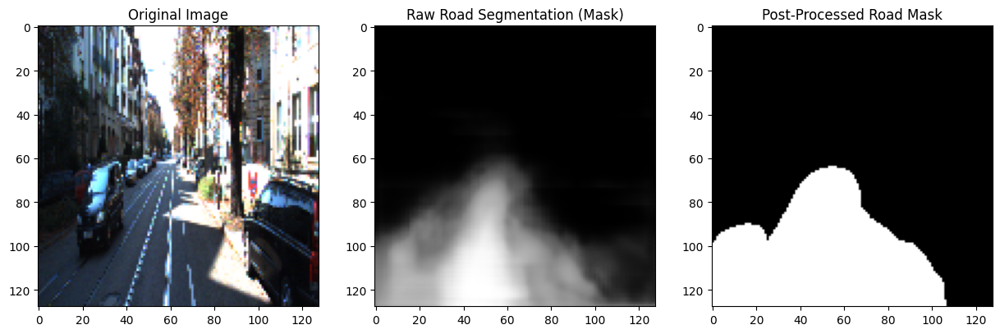

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def post_process_road_mask(mask):
    """
    세그멘테이션 마스크를 후처리하여 도로 영역 복구
    """
    # 1. 마스크 이진화
    binary_mask = (mask > 0.5).astype(np.uint8)  # 0.5 임계값으로 이진화

    # 2. 모폴로지 닫힘 연산으로 작은 구멍 제거
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15, 15))
    closed_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # 3. 팽창 연산으로 끊어진 도로 연결
    dilated_mask = cv2.dilate(closed_mask, kernel, iterations=1)

    # 4. 연결된 컴포넌트 분석으로 가장 큰 도로 영역 선택
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(dilated_mask, connectivity=8)
    largest_label = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])  # 가장 큰 영역 (label=0은 배경)
    largest_mask = (labels == largest_label).astype(np.uint8)

    return largest_mask

# 세그멘테이션 결과로부터 후처리 수행
segmented_mask = unet_binary_model.predict(X[:1])[0].squeeze()  # 예측된 도로 마스크
processed_mask = post_process_road_mask(segmented_mask)  # 후처리 적용

# 결과 시각화
plt.figure(figsize=(15, 10))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(X[0])

plt.subplot(1, 3, 2)
plt.title("Raw Road Segmentation (Mask)")
plt.imshow(segmented_mask, cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Post-Processed Road Mask")
plt.imshow(processed_mask, cmap='gray')

plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


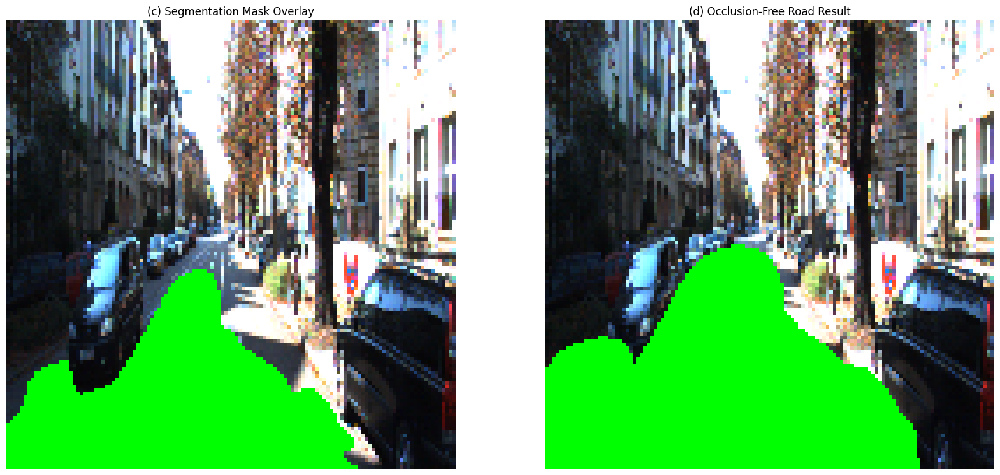

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def visualize_road_segmentation(original_image, mask, processed_mask):
    """
    도로 세그멘테이션 결과를 시각화하여 (c)와 (d) 단계를 생성
    """
    # (원본 이미지에 세그멘테이션 마스크 덧씌우기
    overlay = original_image.copy()
    overlay[mask == 1] = [0, 255, 0]  # 도로 영역을 녹색으로 표시

    # 복구된 도로만 표시 (흑백 이미지에 녹색 도로)
    binary_result = np.stack([original_image[:, :, 0], original_image[:, :, 1], original_image[:, :, 2]], axis=-1)
    binary_result[processed_mask == 1] = [0, 255, 0]

    # 시각화
    plt.figure(figsize=(20, 10))

    # (c) 단계
    plt.subplot(1, 2, 1)
    plt.title("(c) Segmentation Mask Overlay")
    plt.imshow(overlay)
    plt.axis("off")

    # (d) 단계
    plt.subplot(1, 2, 2)
    plt.title("(d) Occlusion-Free Road Result")
    plt.imshow(binary_result)
    plt.axis("off")

    plt.show()

# 세그멘테이션 결과 및 원본 데이터 준비
original_image = X[0]  # 원본 이미지
segmented_mask = post_process_road_mask(unet_binary_model.predict(X[:1])[0].squeeze())  # 후처리된 마스크
raw_mask = (unet_binary_model.predict(X[:1])[0].squeeze() > 0.5).astype(np.uint8)  # 초기 마스크

# 시각화 함수 호출
visualize_road_segmentation(original_image, raw_mask, segmented_mask)


In [ ]:
import keras
keras.saving.save_model(unet_binary_model, '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


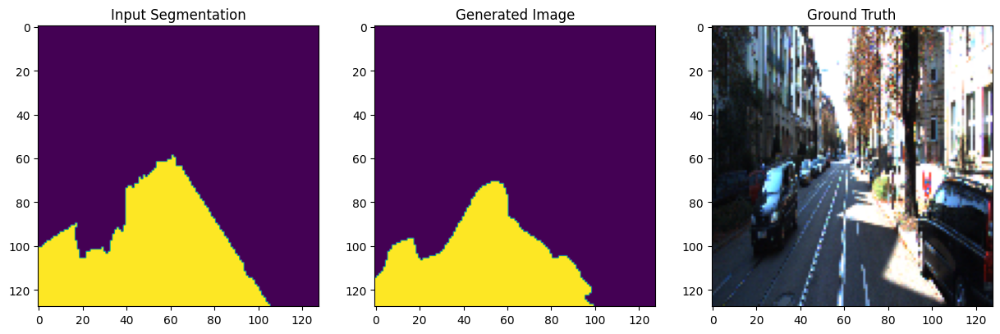

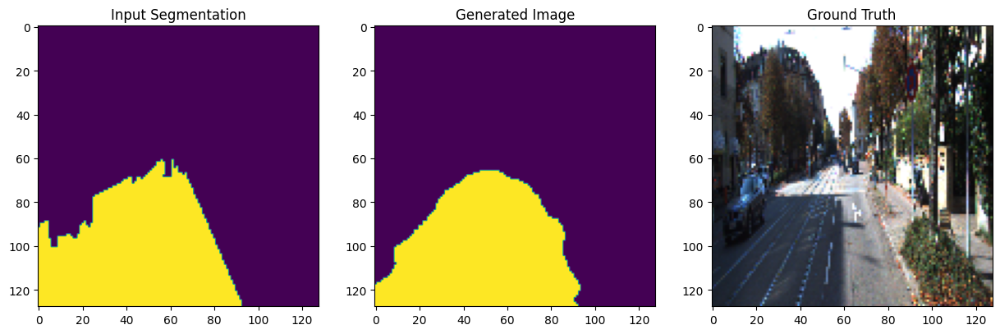

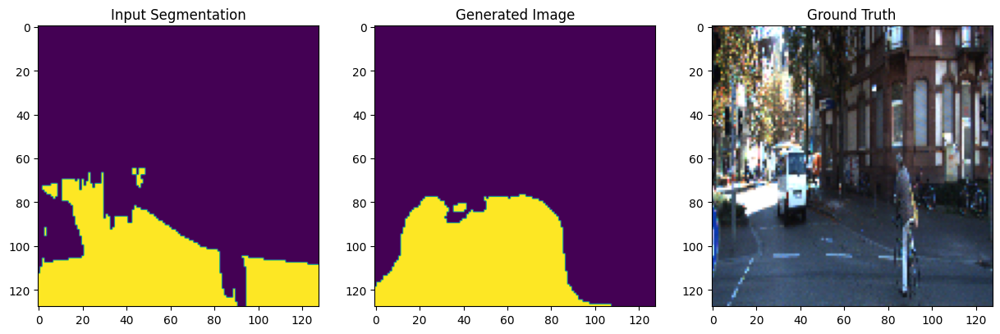

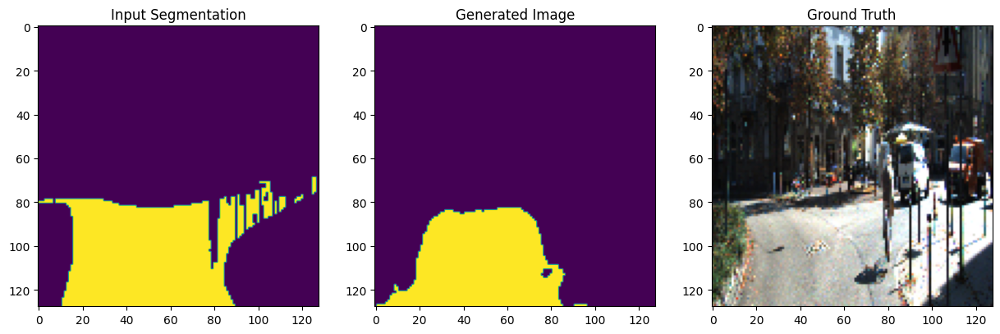

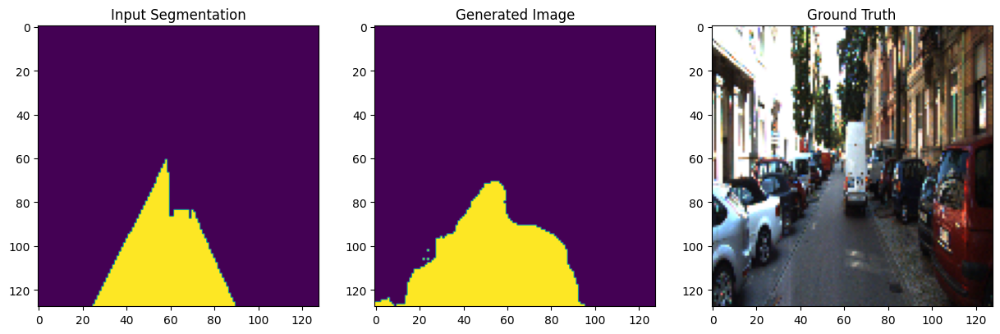

In [ ]:
from tensorflow.keras.models import load_model

# 저장된 모델 불러오기
model_path = '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation.h5'
unet_load_model = load_model(model_path)
unet_load_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

X = np.array([load_image(path) for path in image_paths[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)  # 채널 추가


# 데이터 로드
test_image_path = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/testing/image_2/*.png'))


# 예측 결과 시각화
def show_binary_predictions(model, sample_images, sample_masks):
    predictions = unet_load_model.predict(sample_images) > 0.5  # 0.5를 기준으로 이진화
    for i in range(len(sample_images)):
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.title("Input Segmentation")
        plt.imshow(sample_masks[i])
        plt.subplot(1, 3, 2)
        plt.title("Generated Image")
        plt.imshow(predictions[i])
        plt.subplot(1, 3, 3)
        plt.title("Ground Truth")
        plt.imshow(sample_images[i])
        plt.show()

# 결과 확인
show_binary_predictions(unet_load_model, X[:5], y[:5])

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


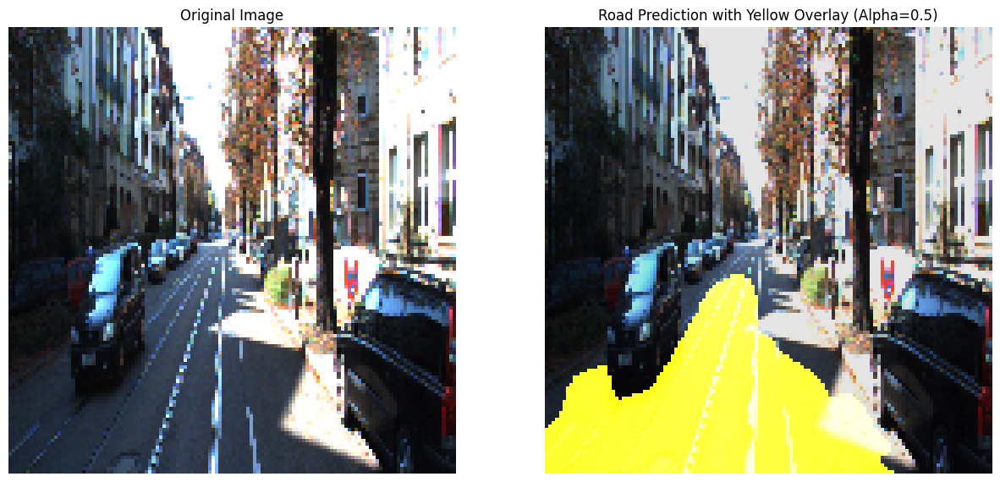

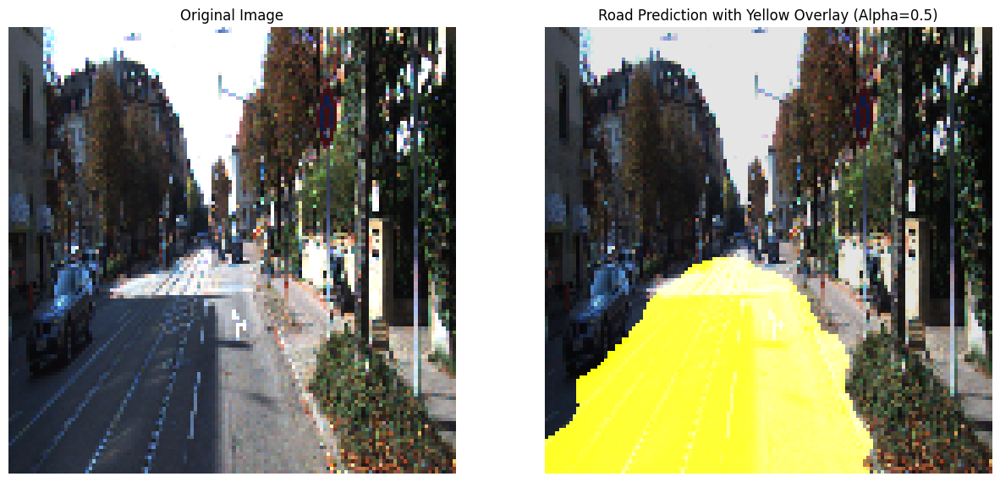

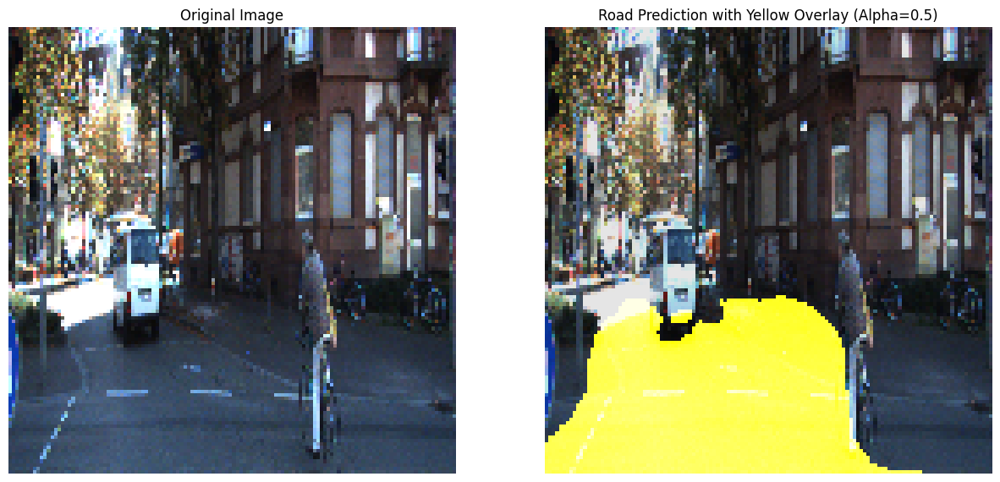

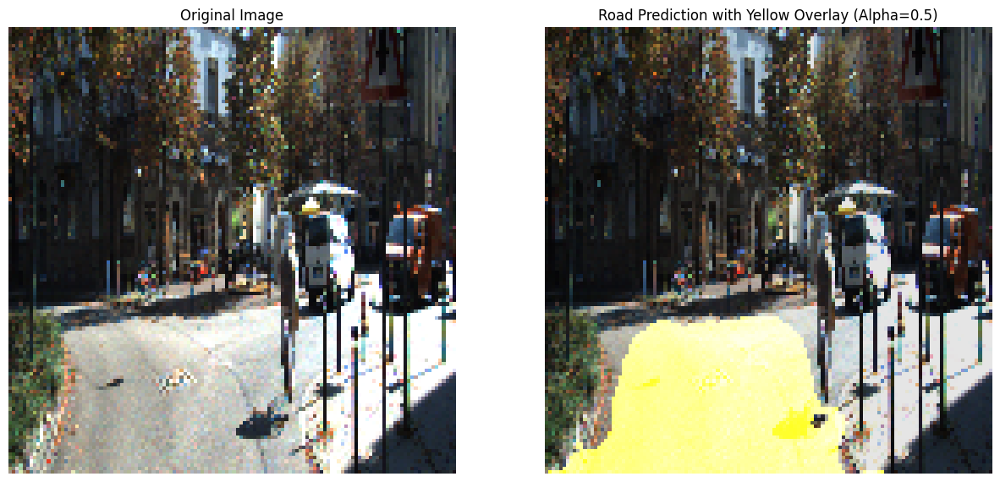

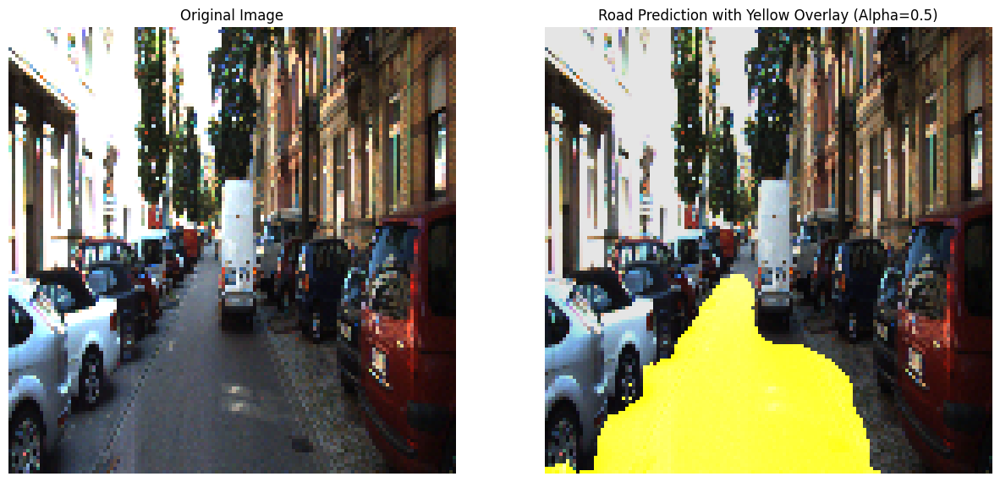

In [ ]:
def show_yellow_overlay_with_original(model, sample_images):
    """
    모델 예측 결과를 원본 이미지 위에 반투명 노란색으로 오버레이하고 원본 이미지도 함께 시각화.
    """
    predictions = model.predict(sample_images) > 0.5  # 0.5 기준 이진화

    for i in range(len(sample_images)):
        plt.figure(figsize=(15, 10))

        # (a) 원본 이미지
        plt.subplot(1, 2, 1)
        plt.title("Original Image")
        plt.imshow(sample_images[i])
        plt.axis("off")

        # (b) 오버레이된 이미지 생성
        original_image = sample_images[i].copy()
        overlay = np.zeros_like(original_image)
        overlay[predictions[i].squeeze() == 1] = [255, 255, 0]  # 도로 영역에 노란색 설정

        # 반투명 합성
        blended_image = cv2.addWeighted(original_image, 0.9, overlay, 0.5, 0)

        # (b) 반투명 오버레이 이미지
        plt.subplot(1, 2, 2)
        plt.title("Road Prediction with Yellow Overlay (Alpha=0.5)")
        plt.imshow(blended_image)
        plt.axis("off")

        plt.show()

# 샘플 데이터 준비
sample_images = X[:5]

# 원본 이미지와 반투명 노란색 오버레이 시각화 실행
show_yellow_overlay_with_original(unet_binary_model, sample_images)


# 성능 향상

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, Input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint
from glob import glob


# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

# U-Net 모델 정의 (이진 세그멘테이션용)
def build_unet_binary(input_shape=(128, 128, 3)):
    inputs = Input(input_shape)
    # 다운샘플링
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    # 병목 구간
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(b)
    # 업샘플링
    u3 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(b)
    u3 = concatenate([u3, c3])
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(u3)
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(c4)
    u2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u2 = concatenate([u2, c2])
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(c5)
    u1 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = concatenate([u1, c1])
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(c6)
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c6)  # 이진 출력
    model = Model(inputs, outputs)
    return model

# 모델 빌드 및 컴파일
unet_binary_model = build_unet_binary()
unet_binary_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# 데이터 로드
image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

X = np.array([load_image(path) for path in image_paths[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

# 체크포인트 경로
checkpoint_path = "/content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-{epoch:02d}.keras"

# ModelCheckpoint 콜백 정의
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,  # 저장 경로
    monitor='val_loss',        # 기준이 되는 메트릭 (validation loss를 기준으로 저장)
    save_best_only=True,       # 최상의 모델만 저장
    save_weights_only=False,   # 전체 모델 저장 (True로 설정하면 가중치만 저장)
    verbose=1                  # 저장 시 로그 출력
)

# 모델 학습 (한 번만 호출)
history = unet_binary_model.fit(
    X, y,
    epochs=100,
    batch_size=8,
    validation_split=0.2,      # 검증 데이터 비율
    callbacks=[checkpoint]     # 콜백 추가
)


Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.7468 - loss: 0.8009 
Epoch 1: val_loss improved from inf to 0.63774, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-01.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 132s 12s/step - accuracy: 0.7485 - loss: 0.7989 - val_accuracy: 0.7862 - val_loss: 0.6377
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.7726 - loss: 0.6237 
Epoch 2: val_loss improved from 0.63774 to 0.54813, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-02.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 144s 13s/step - accuracy: 0.7729 - loss: 0.6216 - val_accuracy: 0.7862 - val_loss: 0.5481
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.7825 - loss: 0.5245 
Epoch 3: val_loss improved from 0.54813 to 0.38781, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-03.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 138s 13s/step - accuracy: 0.7819 - loss: 0.5225 - val_accur

In [ ]:
import keras
keras.saving.save_model(unet_binary_model, '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


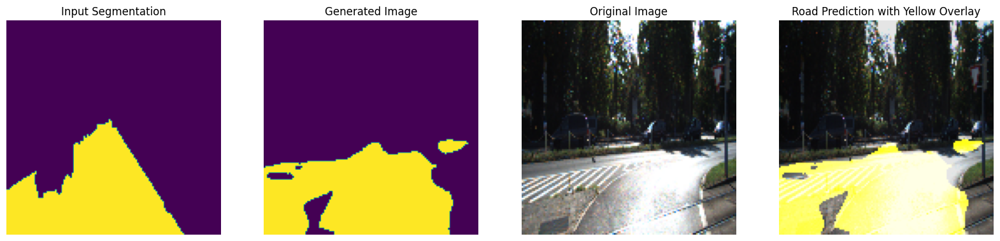

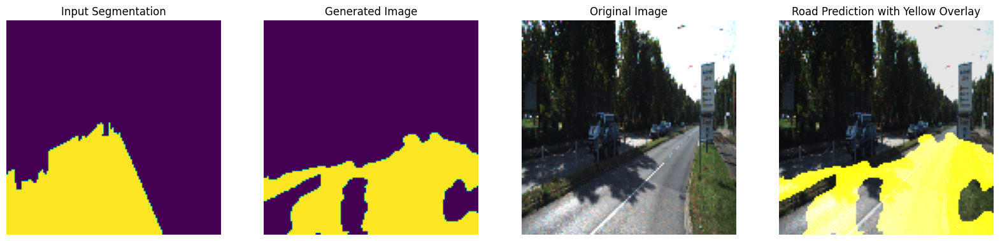

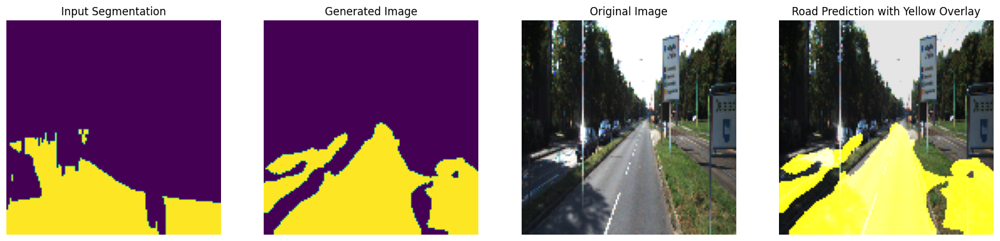

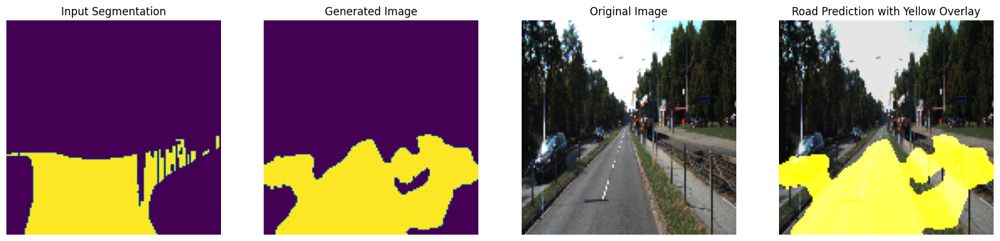

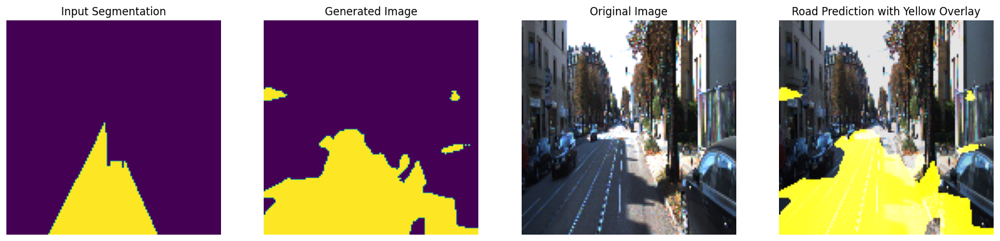

In [ ]:
from tensorflow.keras.models import load_model
from glob import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 저장된 모델 불러오기
model_path = '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade.h5'
unet_load_model = load_model(model_path)

# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)  # 채널 추가

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

X = np.array([load_image(path) for path in test_image_path[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

# 데이터 로드
test_imahge_path = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/testing/image_2/*.png'))


def show_combined_visualization(model, sample_images, sample_masks):
    """
    모델 예측 결과를 원본 이미지와 함께 4개 서브플롯으로 시각화:
    1. Input Segmentation
    2. Generated Image
    3. Ground Truth
    4. Road Prediction with Yellow Overlay
    """
    predictions = unet_load_model.predict(sample_images) > 0.5  # 0.5 기준 이진화

    for i in range(len(sample_images)):
        plt.figure(figsize=(20, 10))

        # (1) Input Segmentation
        plt.subplot(1, 4, 1)
        plt.title("Input Segmentation")
        plt.imshow(sample_masks[i])
        plt.axis("off")

        # (2) Generated Image
        plt.subplot(1, 4, 2)
        plt.title("Generated Image")
        plt.imshow(predictions[i].squeeze())
        plt.axis("off")

        # (3) Ground Truth
        plt.subplot(1, 4, 3)
        plt.title("Original Image")
        plt.imshow(sample_images[i])
        plt.axis("off")

        # (4) Road Prediction with Yellow Overlay
        original_image = sample_images[i].copy()
        overlay = np.zeros_like(original_image)
        overlay[predictions[i].squeeze() == 1] = [255, 255, 0]  # 도로 영역에 노란색 설정

        # 반투명 합성
        blended_image = cv2.addWeighted(original_image, 0.9, overlay, 0.5, 0)

        plt.subplot(1, 4, 4)
        plt.title("Road Prediction with Yellow Overlay")
        plt.imshow(blended_image)
        plt.axis("off")

        plt.show()

# 결과 확인
show_combined_visualization(unet_load_model, X[:5], y[:5])


# V2 (에폭증가)

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, Input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint
from glob import glob


# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

# U-Net 모델 정의 (이진 세그멘테이션용)
def build_unet_binary(input_shape=(128, 128, 3)):
    inputs = Input(input_shape)
    # 다운샘플링
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    # 병목 구간
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(b)
    # 업샘플링
    u3 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(b)
    u3 = concatenate([u3, c3])
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(u3)
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(c4)
    u2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u2 = concatenate([u2, c2])
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(c5)
    u1 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = concatenate([u1, c1])
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(c6)
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c6)  # 이진 출력
    model = Model(inputs, outputs)
    return model



model_path = '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade.h5'
unet_load_model = load_model(model_path)

unet_load_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])



# 데이터 로드
image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

X = np.array([load_image(path) for path in image_paths[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

# 체크포인트 경로
checkpoint_path = "/content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints/v2/checkpoints-{epoch:02d}.keras"

# ModelCheckpoint 콜백 정의
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,  # 저장 경로
    monitor='val_loss',        # 기준이 되는 메트릭 (validation loss를 기준으로 저장)
    save_best_only=True,       # 최상의 모델만 저장
    save_weights_only=False,   # 전체 모델 저장 (True로 설정하면 가중치만 저장)
    verbose=1                  # 저장 시 로그 출력
)

# 모델 학습 (한 번만 호출)
history = unet_load_model.fit(
    X, y,
    epochs=200,
    batch_size=8,
    validation_split=0.2,      # 검증 데이터 비율
    callbacks=[checkpoint]     # 콜백 추가
)


Epoch 1/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.9272 - loss: 0.2302 
Epoch 1: val_loss improved from inf to 0.27083, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints/v2/checkpoints-01.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 124s 12s/step - accuracy: 0.9259 - loss: 0.2304 - val_accuracy: 0.8801 - val_loss: 0.2708
Epoch 2/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.9393 - loss: 0.1607 
Epoch 2: val_loss did not improve from 0.27083
10/10 ━━━━━━━━━━━━━━━━━━━━ 139s 11s/step - accuracy: 0.9395 - loss: 0.1597 - val_accuracy: 0.9051 - val_loss: 0.2836
Epoch 3/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.9637 - loss: 0.0936 
Epoch 3: val_loss did not improve from 0.27083
10/10 ━━━━━━━━━━━━━━━━━━━━ 146s 12s/step - accuracy: 0.9636 - loss: 0.0934 - val_accuracy: 0.8986 - val_loss: 0.3968
Epoch 4/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.9732 - loss: 0.0662 
Epoch 4: val_loss did not improve from 0.27083
10/10 ━━━━━

KeyboardInterrupt: 

In [ ]:
import keras
keras.saving.save_model(unet_binary_model, '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v2.h5')

In [ ]:
from tensorflow.keras.models import load_model
from glob import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 저장된 모델 불러오기
model_path = '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v2.h5'
unet_load_model = load_model(model_path)

# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)  # 채널 추가

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

X = np.array([load_image(path) for path in test_image_path[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

# 데이터 로드
test_imahge_path = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/testing/image_2/*.png'))


def show_combined_visualization(model, sample_images, sample_masks):
    """
    모델 예측 결과를 원본 이미지와 함께 4개 서브플롯으로 시각화:
    1. Input Segmentation
    2. Generated Image
    3. Ground Truth
    4. Road Prediction with Yellow Overlay
    """
    predictions = unet_load_model.predict(sample_images) > 0.5  # 0.5 기준 이진화

    for i in range(len(sample_images)):
        plt.figure(figsize=(20, 10))

        # (1) Input Segmentation
        plt.subplot(1, 4, 1)
        plt.title("Input Segmentation")
        plt.imshow(sample_masks[i])
        plt.axis("off")

        # (2) Generated Image
        plt.subplot(1, 4, 2)
        plt.title("Generated Image")
        plt.imshow(predictions[i].squeeze())
        plt.axis("off")

        # (3) Ground Truth
        plt.subplot(1, 4, 3)
        plt.title("Original Image")
        plt.imshow(sample_images[i])
        plt.axis("off")

        # (4) Road Prediction with Yellow Overlay
        original_image = sample_images[i].copy()
        overlay = np.zeros_like(original_image)
        overlay[predictions[i].squeeze() == 1] = [255, 255, 0]  # 도로 영역에 노란색 설정

        # 반투명 합성
        blended_image = cv2.addWeighted(original_image, 0.9, overlay, 0.5, 0)

        plt.subplot(1, 4, 4)
        plt.title("Road Prediction with Yellow Overlay")
        plt.imshow(blended_image)
        plt.axis("off")

        plt.show()

# 결과 확인
show_combined_visualization(unet_load_model, X[:5], y[:5])


# V3 (배치줄임)

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, Input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint
from glob import glob


# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

# U-Net 모델 정의 (이진 세그멘테이션용)
def build_unet_binary(input_shape=(128, 128, 3)):
    inputs = Input(input_shape)
    # 다운샘플링
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    # 병목 구간
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(b)
    # 업샘플링
    u3 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(b)
    u3 = concatenate([u3, c3])
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(u3)
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(c4)
    u2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u2 = concatenate([u2, c2])
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(c5)
    u1 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = concatenate([u1, c1])
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(c6)
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c6)  # 이진 출력
    model = Model(inputs, outputs)
    return model

# 모델 빌드 및 컴파일
unet_binary_model = build_unet_binary()
unet_binary_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# 데이터 로드
image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

X = np.array([load_image(path) for path in image_paths[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

# 체크포인트 경로
checkpoint_path = "/content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-{epoch:02d}.keras"

# ModelCheckpoint 콜백 정의
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,  # 저장 경로
    monitor='val_loss',        # 기준이 되는 메트릭 (validation loss를 기준으로 저장)
    save_best_only=True,       # 최상의 모델만 저장
    save_weights_only=False,   # 전체 모델 저장 (True로 설정하면 가중치만 저장)
    verbose=1                  # 저장 시 로그 출력
)

# 모델 학습 (한 번만 호출)
history = unet_binary_model.fit(
    X, y,
    epochs=100,
    batch_size=2,
    validation_split=0.2,      # 검증 데이터 비율
    callbacks=[checkpoint]     # 콜백 추가
)


Epoch 1/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7096 - loss: 0.8810
Epoch 1: val_loss improved from inf to 0.50085, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-01.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 134s 3s/step - accuracy: 0.7108 - loss: 0.8765 - val_accuracy: 0.7862 - val_loss: 0.5008
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7806 - loss: 0.4870
Epoch 2: val_loss improved from 0.50085 to 0.42433, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-02.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 145s 3s/step - accuracy: 0.7805 - loss: 0.4872 - val_accuracy: 0.7862 - val_loss: 0.4243
Epoch 3/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7797 - loss: 0.4143
Epoch 3: val_loss improved from 0.42433 to 0.40255, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-03.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 126s 3s/step - accuracy: 0.7797 - loss: 0.4138 - val_accuracy: 0.83

In [ ]:
import keras
keras.saving.save_model(unet_binary_model, '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v3.h5')

In [ ]:
test_image_path = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/testing/image_2/*.png'))

# V4 (v3 에폭증가)

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, Input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint
from glob import glob


# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

# U-Net 모델 정의 (이진 세그멘테이션용)
def build_unet_binary(input_shape=(128, 128, 3)):
    inputs = Input(input_shape)
    # 다운샘플링
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    # 병목 구간
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(b)
    # 업샘플링
    u3 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(b)
    u3 = concatenate([u3, c3])
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(u3)
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(c4)
    u2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u2 = concatenate([u2, c2])
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(c5)
    u1 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = concatenate([u1, c1])
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(c6)
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c6)  # 이진 출력
    model = Model(inputs, outputs)
    return model

model_path = '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v3.h5'
unet_load_model = load_model(model_path)

unet_load_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])



# 데이터 로드
image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

X = np.array([load_image(path) for path in image_paths[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

# 체크포인트 경로
checkpoint_path = "/content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints/v4/checkpoints-{epoch:02d}.keras"

# ModelCheckpoint 콜백 정의
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,  # 저장 경로
    monitor='val_loss',        # 기준이 되는 메트릭 (validation loss를 기준으로 저장)
    save_best_only=True,       # 최상의 모델만 저장
    save_weights_only=False,   # 전체 모델 저장 (True로 설정하면 가중치만 저장)
    verbose=1                  # 저장 시 로그 출력
)

# 모델 학습 (한 번만 호출)
history = unet_load_model.fit(
    X, y,
    epochs=200,
    batch_size=8,
    validation_split=0.2,      # 검증 데이터 비율
    callbacks=[checkpoint]     # 콜백 추가
)


Epoch 1/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9817 - loss: 0.0387 
Epoch 1: val_loss improved from inf to 0.65981, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints/v4/checkpoints-01.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 134s 13s/step - accuracy: 0.9819 - loss: 0.0386 - val_accuracy: 0.8955 - val_loss: 0.6598
Epoch 2/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9867 - loss: 0.0304 
Epoch 2: val_loss did not improve from 0.65981
10/10 ━━━━━━━━━━━━━━━━━━━━ 141s 13s/step - accuracy: 0.9866 - loss: 0.0304 - val_accuracy: 0.8951 - val_loss: 0.6725
Epoch 3/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9897 - loss: 0.0243 
Epoch 3: val_loss did not improve from 0.65981
10/10 ━━━━━━━━━━━━━━━━━━━━ 127s 13s/step - accuracy: 0.9895 - loss: 0.0245 - val_accuracy: 0.8882 - val_loss: 0.7816
Epoch 4/200
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.9874 - loss: 0.0261 
Epoch 4: val_loss did not improve from 0.65981
10/10 ━━━━━

KeyboardInterrupt: 

In [ ]:
import keras
keras.saving.save_model(unet_binary_model, '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v4.h5')

In [ ]:
from tensorflow.keras.models import load_model
from glob import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 저장된 모델 불러오기
model_path = '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v4.h5'
unet_load_model = load_model(model_path)

# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)  # 채널 추가

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

X = np.array([load_image(path) for path in test_image_path[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

# 데이터 로드
test_imahge_path = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/testing/image_2/*.png'))


def show_combined_visualization(model, sample_images, sample_masks):
    """
    모델 예측 결과를 원본 이미지와 함께 4개 서브플롯으로 시각화:
    1. Input Segmentation
    2. Generated Image
    3. Ground Truth
    4. Road Prediction with Yellow Overlay
    """
    predictions = unet_load_model.predict(sample_images) > 0.5  # 0.5 기준 이진화

    for i in range(len(sample_images)):
        plt.figure(figsize=(20, 10))

        # (1) Input Segmentation
        plt.subplot(1, 4, 1)
        plt.title("Input Segmentation")
        plt.imshow(sample_masks[i])
        plt.axis("off")

        # (2) Generated Image
        plt.subplot(1, 4, 2)
        plt.title("Generated Image")
        plt.imshow(predictions[i].squeeze())
        plt.axis("off")

        # (3) Ground Truth
        plt.subplot(1, 4, 3)
        plt.title("Original Image")
        plt.imshow(sample_images[i])
        plt.axis("off")

        # (4) Road Prediction with Yellow Overlay
        original_image = sample_images[i].copy()
        overlay = np.zeros_like(original_image)
        overlay[predictions[i].squeeze() == 1] = [255, 255, 0]  # 도로 영역에 노란색 설정

        # 반투명 합성
        blended_image = cv2.addWeighted(original_image, 0.9, overlay, 0.5, 0)

        plt.subplot(1, 4, 4)
        plt.title("Road Prediction with Yellow Overlay")
        plt.imshow(blended_image)
        plt.axis("off")

        plt.show()

# 결과 확인
show_combined_visualization(unet_load_model, X[:5], y[:5])


# V5 (v3에 드롭아웃 + 데이터증강)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dropout
import cv2
import numpy as np
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, Input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint
from glob import glob


# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화


# 데이터 증강 생성기
datagen = ImageDataGenerator(
    horizontal_flip=True,  # 수평 뒤집기
    zoom_range=0.2,        # 랜덤 줌
    rotation_range=15,     # 랜덤 회전
    width_shift_range=0.1, # 폭 이동
    height_shift_range=0.1 # 높이 이동
)

# U-Net 모델 수정: 드롭아웃 추가
def build_unet_binary_with_dropout(input_shape=(128, 128, 3)):
    inputs = Input(input_shape)
    # 다운샘플링
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    c1 = Dropout(0.3)(c1)  # 드롭아웃 추가
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    c2 = Dropout(0.3)(c2)  # 드롭아웃 추가
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    c3 = Dropout(0.3)(c3)  # 드롭아웃 추가
    p3 = MaxPooling2D((2, 2))(c3)

    # 병목 구간
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(b)
    b = Dropout(0.3)(b)  # 드롭아웃 추가

    # 업샘플링
    u3 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(b)
    u3 = concatenate([u3, c3])
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(u3)
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(c4)
    c4 = Dropout(0.3)(c4)  # 드롭아웃 추가

    u2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u2 = concatenate([u2, c2])
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(c5)
    c5 = Dropout(0.3)(c5)  # 드롭아웃 추가

    u1 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = concatenate([u1, c1])
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(c6)
    c6 = Dropout(0.3)(c6)  # 드롭아웃 추가

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c6)  # 이진 출력
    model = Model(inputs, outputs)
    return model

# 모델 빌드 및 컴파일
unet_binary_model = build_unet_binary_with_dropout()
unet_binary_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# 데이터 증강 적용
augmented_data = datagen.flow(X, y, batch_size=2)

# 데이터 로드
image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

X = np.array([load_image(path) for path in image_paths[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

# 체크포인트 경로
checkpoint_path = "/content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-{epoch:02d}.keras"

# ModelCheckpoint 콜백 정의
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,  # 저장 경로
    monitor='val_loss',        # 기준이 되는 메트릭 (validation loss를 기준으로 저장)
    save_best_only=True,       # 최상의 모델만 저장
    save_weights_only=False,   # 전체 모델 저장 (True로 설정하면 가중치만 저장)
    verbose=1                  # 저장 시 로그 출력
)


# 데이터 증강 생성기 (학습용)
train_datagen = ImageDataGenerator(
    horizontal_flip=True,
    zoom_range=0.2,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1
)

# 데이터 증강 생성기 (검증용 - 증강 없이 단순 재스케일)
val_datagen = ImageDataGenerator()

# 데이터 나누기 (80% 학습, 20% 검증)
split_index = int(len(X) * 0.8)
X_train, X_val = X[:split_index], X[split_index:]
y_train, y_val = y[:split_index], y[split_index:]

# 증강 데이터 생성기 설정
train_generator = train_datagen.flow(X_train, y_train, batch_size=2)
val_generator = val_datagen.flow(X_val, y_val, batch_size=2)

# 모델 학습 (데이터 증강 및 드롭아웃 적용)
history = unet_binary_model.fit(
    train_generator,
    epochs=100,
    validation_data=val_generator,
    callbacks=[checkpoint],
    steps_per_epoch=len(X_train) // 2,
    validation_steps=len(X_val) // 2
)


Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7603 - loss: 0.6316
Epoch 1: val_loss improved from inf to 0.44902, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-01.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 150s 4s/step - accuracy: 0.7606 - loss: 0.6300 - val_accuracy: 0.7862 - val_loss: 0.4490
Epoch 2/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 3/100


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
/usr/local/lib/python3.10/dist-packages/keras/src/callbacks/model_checkpoint.py:206: UserWarning: Can save best model only with val_loss available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7624 - loss: 0.4802
Epoch 3: val_loss improved from 0.44902 to 0.44277, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-03.keras
40/40 ━━━━━━━━━━━━━━━━━━━━ 197s 3s/step - accuracy: 0.7626 - loss: 0.4799 - val_accuracy: 0.7862 - val_loss: 0.4428
Epoch 4/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 610us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 5/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7911 - loss: 0.4082
Epoch 5: val_loss did not improve from 0.44277
40/40 ━━━━━━━━━━━━━━━━━━━━ 135s 3s/step - accuracy: 0.7907 - loss: 0.4088 - val_accuracy: 0.7862 - val_loss: 0.4623
Epoch 6/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 610us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00
Epoch 7/100
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7831 - loss: 0.4413
Epoch 7: val_loss improved from 0.44277 to 0.43092, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints-07.keras
40/40 ━

KeyboardInterrupt: 

In [ ]:
import keras
keras.saving.save_model(unet_binary_model, '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v5.h5')

In [ ]:
test_image_path = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/testing/image_2/*.png'))

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


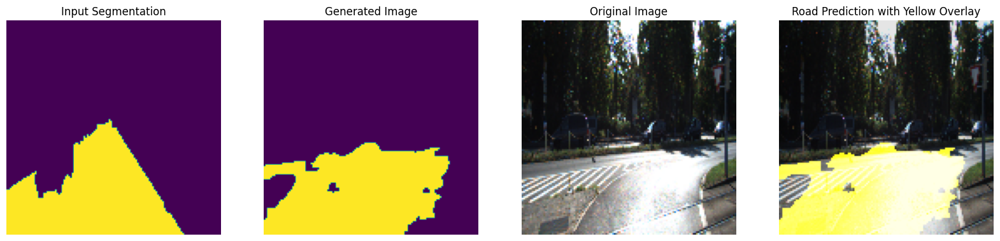

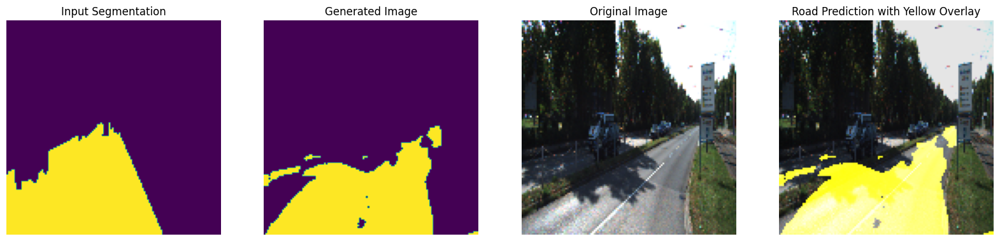

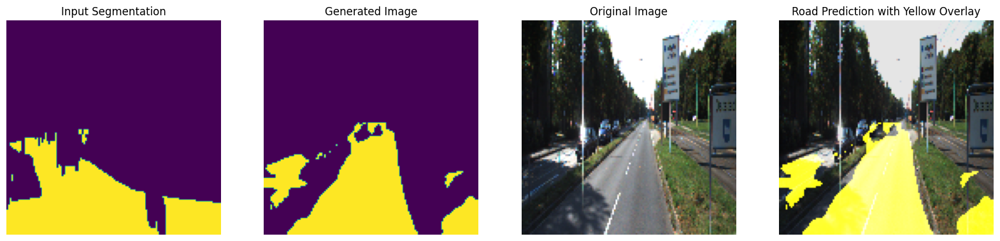

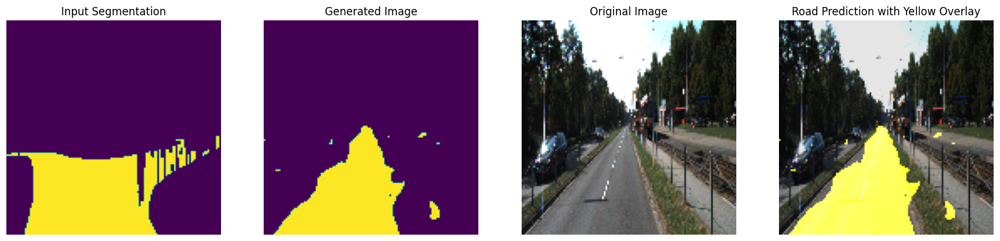

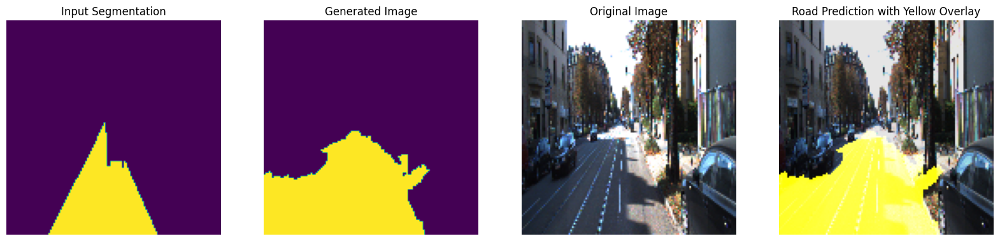

In [ ]:
from tensorflow.keras.models import load_model
from glob import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 저장된 모델 불러오기
model_path = '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v3.h5'
unet_load_model = load_model(model_path)

# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)  # 채널 추가

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

X = np.array([load_image(path) for path in test_image_path[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

test_image_path = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/testing/image_2/*.png'))
image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100


def show_combined_visualization(model, sample_images, sample_masks):
    """
    모델 예측 결과를 원본 이미지와 함께 4개 서브플롯으로 시각화:
    1. Input Segmentation
    2. Generated Image
    3. Ground Truth
    4. Road Prediction with Yellow Overlay
    """
    predictions = unet_load_model.predict(sample_images) > 0.5  # 0.5 기준 이진화

    for i in range(len(sample_images)):
        plt.figure(figsize=(20, 10))

        # (1) Input Segmentation
        plt.subplot(1, 4, 1)
        plt.title("Input Segmentation")
        plt.imshow(sample_masks[i])
        plt.axis("off")

        # (2) Generated Image
        plt.subplot(1, 4, 2)
        plt.title("Generated Image")
        plt.imshow(predictions[i].squeeze())
        plt.axis("off")

        # (3) Ground Truth
        plt.subplot(1, 4, 3)
        plt.title("Original Image")
        plt.imshow(sample_images[i])
        plt.axis("off")

        # (4) Road Prediction with Yellow Overlay
        original_image = sample_images[i].copy()
        overlay = np.zeros_like(original_image)
        overlay[predictions[i].squeeze() == 1] = [255, 255, 0]  # 도로 영역에 노란색 설정

        # 반투명 합성
        blended_image = cv2.addWeighted(original_image, 0.9, overlay, 0.5, 0)

        plt.subplot(1, 4, 4)
        plt.title("Road Prediction with Yellow Overlay")
        plt.imshow(blended_image)
        plt.axis("off")

        plt.show()

# 결과 확인
show_combined_visualization(unet_load_model, X[:5], y[:5])


# V6 Early Stopping

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, Input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint
from glob import glob
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import load_model



# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

# U-Net 모델 정의 (이진 세그멘테이션용)
def build_unet_binary(input_shape=(128, 128, 3)):
    inputs = Input(input_shape)
    # 다운샘플링
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    # 병목 구간
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(b)
    # 업샘플링
    u3 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(b)
    u3 = concatenate([u3, c3])
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(u3)
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(c4)
    u2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u2 = concatenate([u2, c2])
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(c5)
    u1 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = concatenate([u1, c1])
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(c6)
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c6)  # 이진 출력
    model = Model(inputs, outputs)
    return model

model_path = '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v3.h5'
unet_load_model = load_model(model_path)
unet_load_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])



# 데이터 로드
image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

X = np.array([load_image(path) for path in image_paths[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

# 체크포인트 경로
checkpoint_path = "/content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints/v4/checkpoints-{epoch:02d}.keras"

# ModelCheckpoint 콜백 정의
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,  # 저장 경로
    monitor='val_loss',        # 기준이 되는 메트릭 (validation loss를 기준으로 저장)
    save_best_only=True,       # 최상의 모델만 저장
    save_weights_only=False,   # 전체 모델 저장 (True로 설정하면 가중치만 저장)
    verbose=1                  # 저장 시 로그 출력
)

# 모델 학습
history = unet_load_model.fit(
    X, y,
    epochs=100,
    batch_size=8,
    validation_split=0.2,      # 검증 데이터 비율
    callbacks=[checkpoint, early_stopping]  # EarlyStopping 추가
)


Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9841 - loss: 0.0332
Epoch 1: val_loss improved from inf to 0.68665, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints/v4/checkpoints-01.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 117s 11s/step - accuracy: 0.9841 - loss: 0.0330 - val_accuracy: 0.8903 - val_loss: 0.6867
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9850 - loss: 0.0312
Epoch 2: val_loss did not improve from 0.68665
10/10 ━━━━━━━━━━━━━━━━━━━━ 134s 11s/step - accuracy: 0.9851 - loss: 0.0311 - val_accuracy: 0.8939 - val_loss: 0.7161
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9856 - loss: 0.0284
Epoch 3: val_loss did not improve from 0.68665
10/10 ━━━━━━━━━━━━━━━━━━━━ 144s 11s/step - accuracy: 0.9857 - loss: 0.0283 - val_accuracy: 0.8960 - val_loss: 0.7226
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.9868 - loss: 0.0249 
Epoch 4: val_loss did not improve from 0.68665
10/10 ━━━━━━━━

In [ ]:
import keras
keras.saving.save_model(unet_load_model, '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v6.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


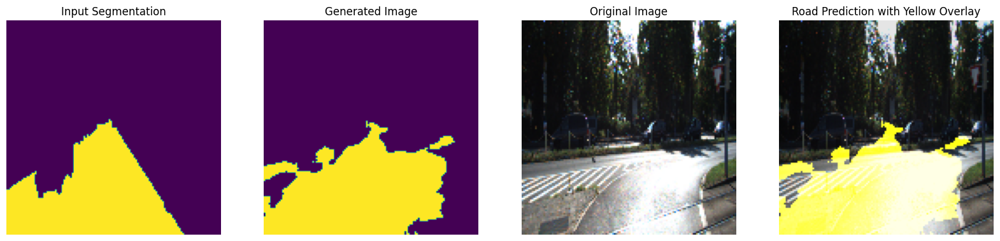

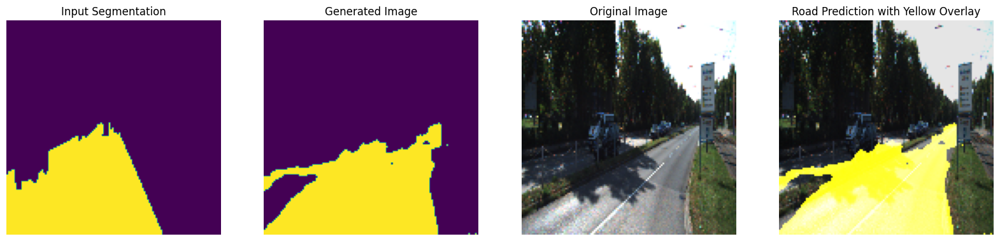

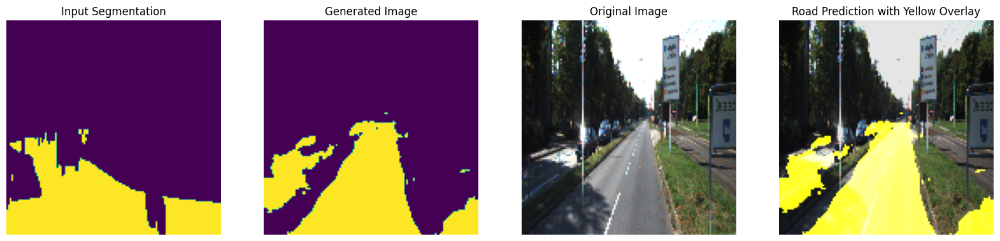

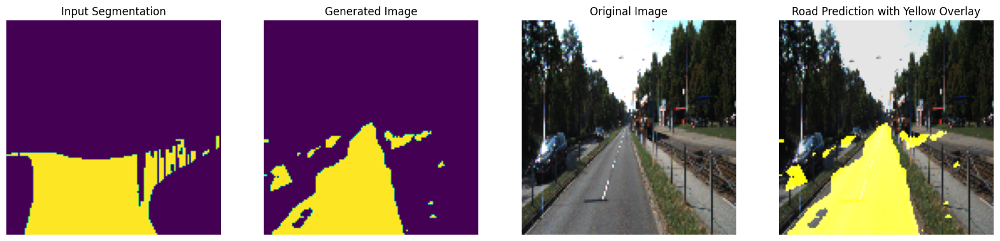

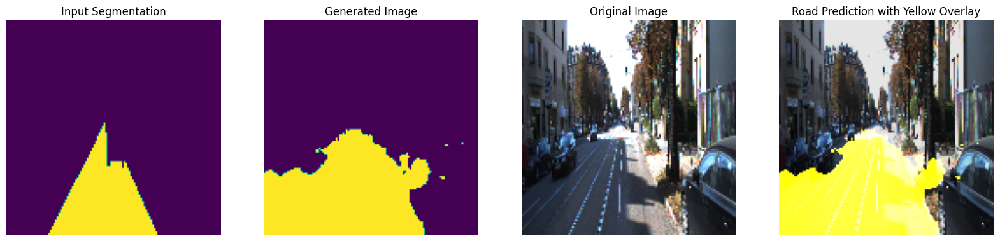

In [ ]:
from tensorflow.keras.models import load_model
from glob import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 저장된 모델 불러오기
model_path = '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v6.h5'
unet_load_model = load_model(model_path)

# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)  # 채널 추가

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

test_image_path = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/testing/image_2/*.png'))
image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

X = np.array([load_image(path) for path in test_image_path[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)




def show_combined_visualization(model, sample_images, sample_masks):
    """
    모델 예측 결과를 원본 이미지와 함께 4개 서브플롯으로 시각화:
    1. Input Segmentation
    2. Generated Image
    3. Ground Truth
    4. Road Prediction with Yellow Overlay
    """
    predictions = unet_load_model.predict(sample_images) > 0.5  # 0.5 기준 이진화

    for i in range(len(sample_images)):
        plt.figure(figsize=(20, 10))

        # (1) Input Segmentation
        plt.subplot(1, 4, 1)
        plt.title("Input Segmentation")
        plt.imshow(sample_masks[i])
        plt.axis("off")

        # (2) Generated Image
        plt.subplot(1, 4, 2)
        plt.title("Generated Image")
        plt.imshow(predictions[i].squeeze())
        plt.axis("off")

        # (3) Ground Truth
        plt.subplot(1, 4, 3)
        plt.title("Original Image")
        plt.imshow(sample_images[i])
        plt.axis("off")

        # (4) Road Prediction with Yellow Overlay
        original_image = sample_images[i].copy()
        overlay = np.zeros_like(original_image)
        overlay[predictions[i].squeeze() == 1] = [255, 255, 0]  # 도로 영역에 노란색 설정

        # 반투명 합성
        blended_image = cv2.addWeighted(original_image, 0.9, overlay, 0.5, 0)

        plt.subplot(1, 4, 4)
        plt.title("Road Prediction with Yellow Overlay")
        plt.imshow(blended_image)
        plt.axis("off")

        plt.show()

# 결과 확인
show_combined_visualization(unet_load_model, X[:5], y[:5])

# V7 Early Stopping (다시) / 안됨

In [ ]:
import cv2
import numpy as np
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, Input
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint
from glob import glob
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import load_model



# 도로를 나타내는 마스크 전처리 함수
def preprocess_masks_for_road(mask_paths, sample_size=100):
    masks = []
    for path in mask_paths[:sample_size]:
        mask = cv2.imread(path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = cv2.resize(mask, (128, 128))  # 크기 조정
        road_color = [128, 64, 128]
        binary_mask = np.all(mask == road_color, axis=-1).astype(np.float32)  # 이진화
        masks.append(binary_mask)
    return np.expand_dims(np.array(masks), axis=-1)

def load_image(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (128, 128))  # 입력 크기를 128x128로 조정
    return image / 255.0  # 정규화

# U-Net 모델 정의 (이진 세그멘테이션용)
def build_unet_binary(input_shape=(128, 128, 3)):
    inputs = Input(input_shape)
    # 다운샘플링
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    # 병목 구간
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    b = Conv2D(512, (3, 3), activation='relu', padding='same')(b)
    # 업샘플링
    u3 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(b)
    u3 = concatenate([u3, c3])
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(u3)
    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(c4)
    u2 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c4)
    u2 = concatenate([u2, c2])
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    c5 = Conv2D(128, (3, 3), activation='relu', padding='same')(c5)
    u1 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c5)
    u1 = concatenate([u1, c1])
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(u1)
    c6 = Conv2D(64, (3, 3), activation='relu', padding='same')(c6)
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c6)  # 이진 출력
    model = Model(inputs, outputs)
    return model

model_path = '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v3.h5'
unet_load_model = load_model(model_path)
unet_load_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])



# 데이터 로드
image_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/image_2/*.png'))
mask_paths = sorted(glob('/content/drive/MyDrive/Colab Notebooks/학부연구생/U-NET/data_semantics/training/semantic_rgb/*.png'))
sample_size = 100

X = np.array([load_image(path) for path in image_paths[:sample_size]])
y = preprocess_masks_for_road(mask_paths, sample_size)

# 체크포인트 경로
checkpoint_path = "/content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints/v4/checkpoints-{epoch:02d}.keras"

# ModelCheckpoint 콜백 정의
checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,  # 저장 경로
    monitor='val_loss',        # 기준이 되는 메트릭 (validation loss를 기준으로 저장)
    save_best_only=True,       # 최상의 모델만 저장
    save_weights_only=False,   # 전체 모델 저장 (True로 설정하면 가중치만 저장)
    verbose=1                  # 저장 시 로그 출력
)

# 모델 학습
history = unet_load_model.fit(
    X, y,
    epochs=100,
    batch_size=8,
    validation_split=0.2,      # 검증 데이터 비율
    callbacks=[checkpoint, early_stopping]  # EarlyStopping 추가
)


Epoch 1/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9818 - loss: 0.0373 
Epoch 1: val_loss improved from inf to 0.69971, saving model to /content/drive/MyDrive/Colab Notebooks/학부연구생/checkpoints/v4/checkpoints-01.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 116s 11s/step - accuracy: 0.9820 - loss: 0.0369 - val_accuracy: 0.8976 - val_loss: 0.6997
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9891 - loss: 0.0243 
Epoch 2: val_loss did not improve from 0.69971
10/10 ━━━━━━━━━━━━━━━━━━━━ 140s 11s/step - accuracy: 0.9888 - loss: 0.0247 - val_accuracy: 0.8961 - val_loss: 0.8378
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9864 - loss: 0.0262
Epoch 3: val_loss did not improve from 0.69971
10/10 ━━━━━━━━━━━━━━━━━━━━ 138s 10s/step - accuracy: 0.9865 - loss: 0.0261 - val_accuracy: 0.8962 - val_loss: 0.8552
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.9883 - loss: 0.0246
Epoch 4: val_loss did not improve from 0.69971
10/10 ━━━━━━━

In [ ]:
import keras
keras.saving.save_model(unet_load_model, '/content/drive/MyDrive/Colab Notebooks/학부연구생/unet_road_segmentation_upgrade_v7.h5')